# Interrogate Routine Core Analysis (RCA) Data using Python's Altair and Panel

**Load python libraries:**

In [1]:
import altair as alt
import numpy as np
import pandas as pd
import panel as pn
#pn.extension('vega')
pn.extension('tabulator')

pn.extension(sizing_mode = 'stretch_width')

import base64, io, IPython
from PIL import Image as PILImage


## Read in Excel file Core Data with Thin Section image paths and Thomeer Capillary Pressure Parameters:

In [2]:
#read the file
file = r'Clastic_TS_Altair8.xlsx'
source7 = pd.read_excel(file,index_col=False)


## Use Panel widgets in Tabulator to view new DataFrame called source7:

In [3]:
df_widget = pn.widgets.Tabulator(source7)
df_widget

Tabulator(sizing_mode='stretch_width', value=    Sample  Porosity  ...)

## This is how we prepare the Thin Section images to be rendered in Altair:

In [4]:
images=source7['image_raw']

imgCode = []

for imgPath in images:
    image = PILImage.open(imgPath)
    output = io.BytesIO()    
    image.save(output, format='png')
    encoded_string = "data:image/jpeg;base64,"+base64.b64encode(output.getvalue()).decode()
    imgCode.append(encoded_string)


x=source7['Porosity']
y=source7['Permeability']
sqrtkphi =source7['sqrt(k/phi)']
rockindex = source7['ROCK_INDEX']
sample = source7['Sample']

source = pd.DataFrame({"Porosity": x, "Permeability": y, "image": imgCode,"sqrt(k/phi)":sqrtkphi,"ROCK_INDEX":rockindex, "Sample":sample})



## Create Pc curves from Thomeer Parameters:

In [5]:
# =============================================================================
# # ===========================================================================
# # #--------------------------------------------------------------------------
# # #           
# # #               CREATE Pc PLOTS from kNN Values of Thomeer
# # #                   
# # #--------------------------------------------------------------------------
# # ===========================================================================
# =============================================================================

Pd1 = source7['Pd1']
G1  = source7['G1']
BV1 = source7['BV1']



Pc = 0.5
bvarray = []; #make list of 0 length
pcarray = []
Sample  = []

#for k in range (0,len(source6)):
   
for k in range (0,len(source7)):
    Pc = 0.5    
    for j in range(1, 105, 1):
        if Pc > Pd1[k]:
            BVOCC1 = BV1[k] * 10**((-0.434 * G1[k]) / np.log10(Pc / Pd1[k]))
        else:
            BVOCC1 = 0.001



        BVOCC = BVOCC1
        
        Sample.append(k+1)
        bvarray.append(BVOCC); #add items 
        pcarray.append(Pc); #add items 

        Pc = Pc * 1.12
        

## Create a pandas DataFrame called df_Pc from the Thomeer Parameter calculated Pc and BVOCC:

In [6]:
df_bv=pd.DataFrame(bvarray,columns=['BVOCC'])
df_pc=pd.DataFrame(pcarray, columns=['Pc'])
df_sample=pd.DataFrame(Sample, columns=['Sample'])
#index_col=False

df_Pc=pd.DataFrame()
df_Pc['Sample'] = df_sample
df_Pc['Pc'] = df_pc
df_Pc['BVOCC'] = df_bv


df_Pc.head()
#print(len(df_Pc))

,Sample,Pc,BVOCC
0,1,0.500000,0.001
1,1,0.560000,0.001
2,1,0.627200,0.001
3,1,0.702464,0.001
4,1,0.786760,0.001


## Create a combined DataFrame called f3:

**There are two ways presented below**

**This method uses join and not merge as used in the cell above that we did not use:**

In [7]:
# reading the files
f1 = df_Pc
f2 = source7

# merging the files
f3 = f1.join(f2.set_index('Sample'),on='Sample')

# Make our final plot of Porosity-Permeability Cross Plot, Select RCA data and Selected Pc curves using Altair:

alt.HConcatChart(...)
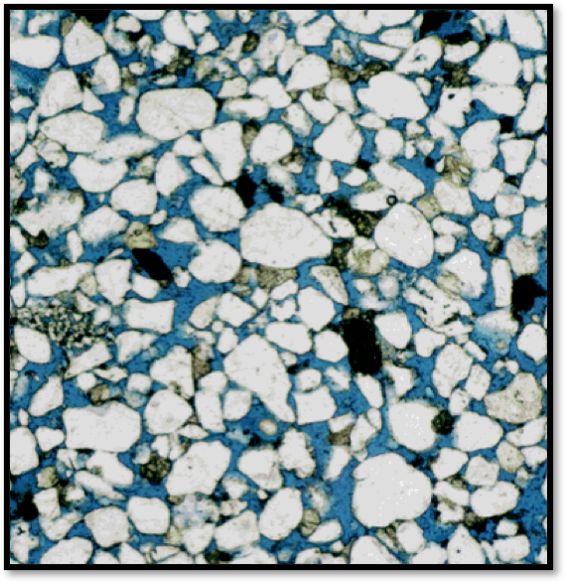
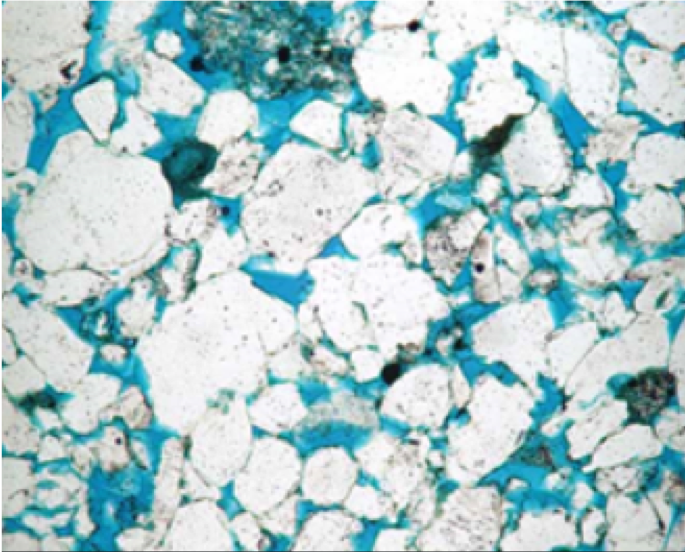
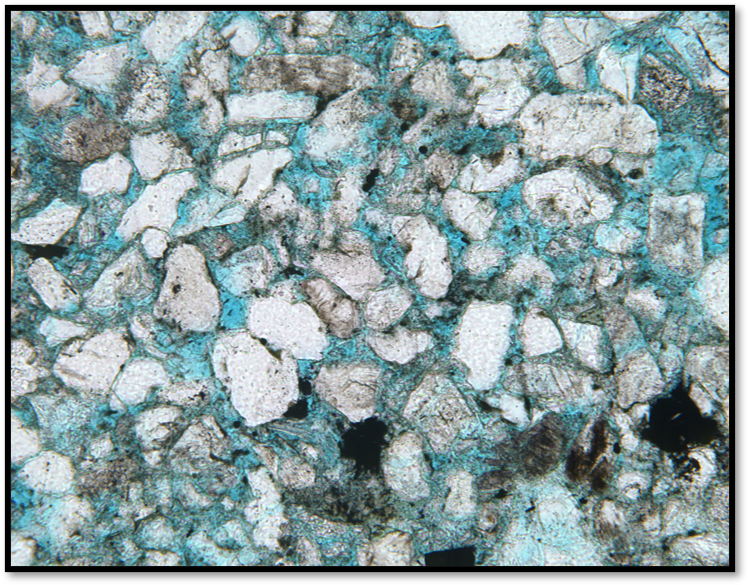
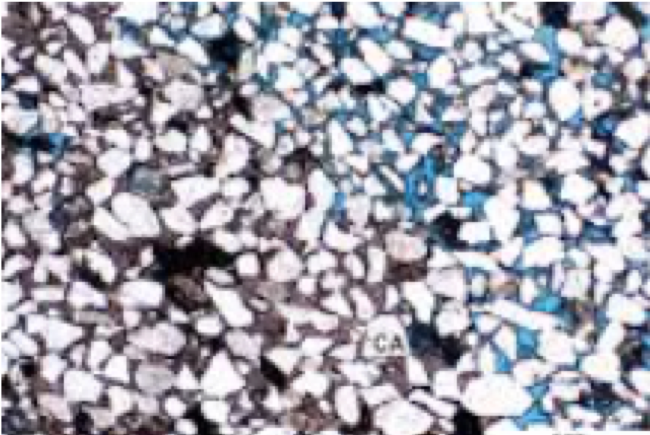
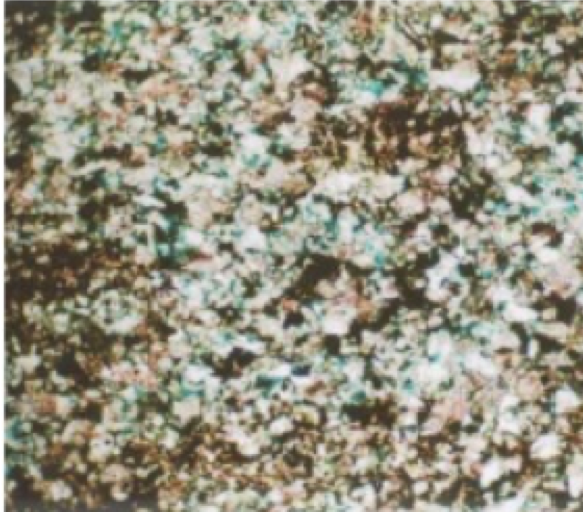
...
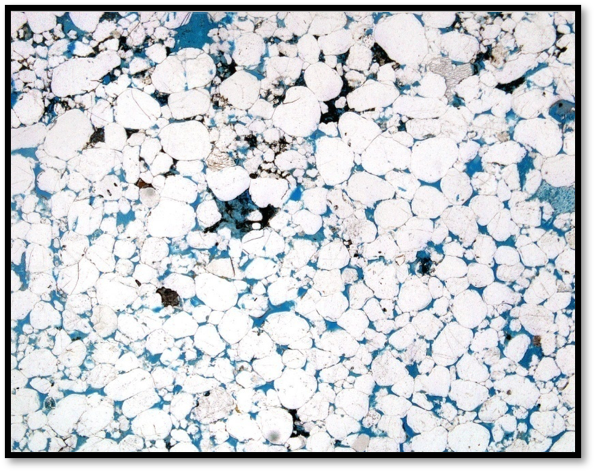
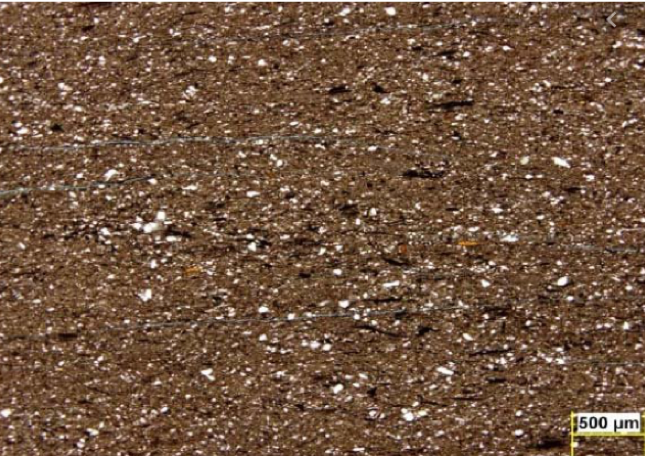
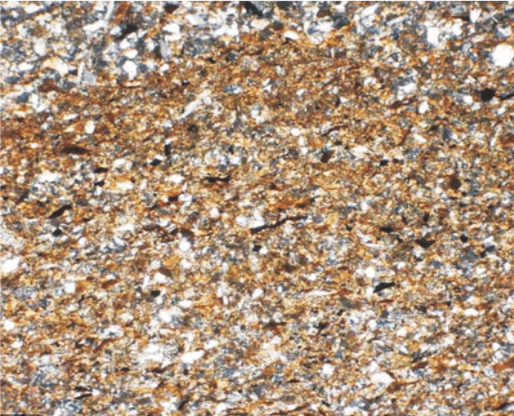
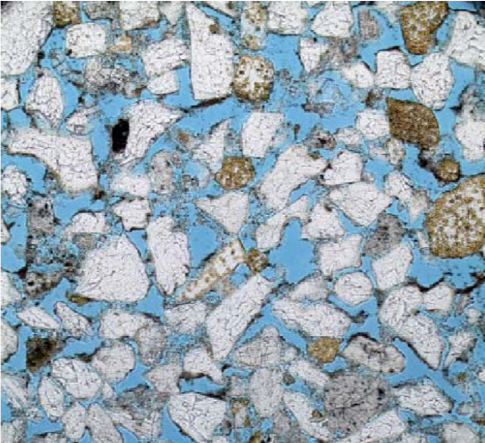
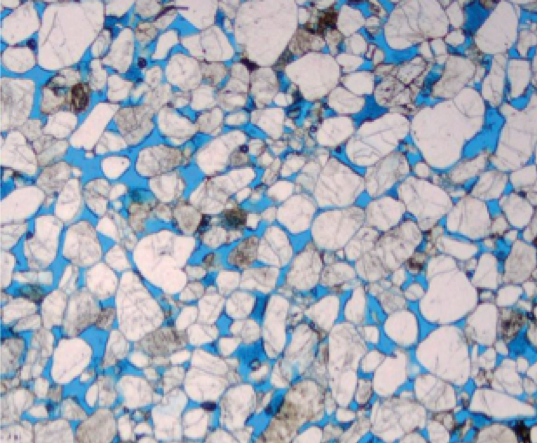

In [8]:
#------------------------------------------------
#
#   Porosity vs. Permeability Cross Plot
#
#------------------------------------------------
# Brush for selection
brush = alt.selection(type='interval')

chart = alt.Chart(source).mark_circle(size=300).encode(
    alt.X('Porosity:Q',
        scale=alt.Scale(domain=(0, 0.4))),
    #y='Perm',
    alt.Y('Permeability:Q',scale=alt.Scale(type='log', base=10,domain=(.0001, 10000))),
    
    color=alt.condition( brush,'ROCK_INDEX:O', alt.value('lightgray'),
                        scale=alt.Scale(
                        domain=[ 1,         2,         3  ,  4 ],
                        range =['cyan', 'blue'  , 'yellow', 'brown'])),
    tooltip=['image','Sample','Porosity','Permeability','sqrt(k/phi)'],  # Must be a list for the image to render
    
).properties(
    width=350,
    height=450, 

    title='Porosity vs. Permeability Cross Plot Colored by PRT',

).add_selection(brush)
    
vega_pane = pn.pane.Vega(chart.add_selection(
    brush
))

#------------------------------------------------
#
#       Text Data for Routine Core Analysis data
#
#------------------------------------------------
# Base chart for data tables
ranked_text = alt.Chart(source7).mark_text(align='right').encode(
    y=alt.Y('row_number:O',axis=None)
).transform_window(
    row_number='row_number()'
).transform_filter(
    brush
).transform_window(
    rank='rank(row_number)'
).transform_filter(
    alt.datum.rank<30
)


# Data Tables
Porosity = ranked_text.encode(text='Porosity:N').properties(title=alt.TitleParams(text='Porosity', align='right'))
Permeability = ranked_text.encode(text='Permeability:N').properties(title=alt.TitleParams(text='Permeability', align='right'))
Sample = ranked_text.encode(text='Sample:N').properties(title=alt.TitleParams(text='Sample', align='right'))
sqrt = ranked_text.encode(text='sqrt(k/phi):N').properties(title=alt.TitleParams(text ='sqrt(k/phi)', align='right'))
#Image = ranked_text.encode(tooltip ='image').properties(title=alt.TitleParams(text ='image', align='right'))
RI = ranked_text.encode(text='ROCK_INDEX:N').properties(title=alt.TitleParams(text='PRT', align='right'))

text = alt.hconcat(Sample, Porosity, Permeability,RI) # Combine data tables

#------------------------------------------------
#
#       Capillary Pressure Curves colored by PRT
#
#------------------------------------------------
pc = alt.Chart(f3).mark_line(clip=True).encode(
    alt.X('BVOCC:Q',
        scale=alt.Scale(domain=(40, 0))
    ),    
    alt.Y('Pc:Q',scale=alt.Scale(type='log', base=10,domain=(1, 100000))),
    color=alt.condition(brush, 'ROCK_INDEX:O', alt.value('lightgray'),scale=alt.Scale(scheme='rainbow')),
    #tooltip='Mode:Q', 
    tooltip=['image_raw','Sample','Porosity','Permeability','sqrt(k/phi)'],
    strokeDash='Sample:N',
).properties(
    title='Pc Curves with PRT on Color Axis',
    width=300,
    height=450, 
    
).transform_filter(
    brush
)


#------------------------------------------------
#   Concatenate Cross Plot, Text and Pc curves
#------------------------------------------------
# Build visualization
alt.hconcat(
    chart,
    pc,
    text
).resolve_legend(
    color="shared"
).configure_view(strokeWidth=0)
